----
----
# Twitter Sentiment analysis using NLP and Naive Bayes
----
----

This notebook walks through the application of NLP to determine if consumers on Twitter are happy or upset with a company n.

NLP works by converting words (text) into numbers which are used to train AI/ML models to make predictions. These predictions can be sentiment inferred from social media.  

Ex of good tweet:  "Good morning! Such a beutiful sunny day!" -> Positive (1)
Ex of bad tweet: " Don't fly on "xx" airline, they are terrible to their customers." -> Negative (0)

-----
## Project Structure

1. Import library and dataset
2. Perform Exploratory Data Analysis
3. Plot the word cloud
4. Perform data cleaning - removing punctuation
5. Perform data cleaning - remove stop words
6. Perform COunt Vectorization (Tokenization)
7. Create pipeline to handle steps 4-6
8. Apply concepts of theory behind Naive Bayes classifiers
9. Assess trained model performance


----
# Import Libraries and Dataset
----

In [2]:
# Set the notebook to monokai theme for the purpose of seeing the axis more clearly

import pandas as pd
import numpy as np 
import seaborn as sns 
import matplotlib.pyplot as plt 

%matplotlib inline
#from jupyterthemes import jtplot 
#jtplot.style(theme='monokai', contex='notebook', ticks=True, grid=False)



In [3]:
# Load Data set

tweets_df = pd.read_csv('../../data/twitter.csv')
tweets_df

FileNotFoundError: [Errno 2] File ../data/twitter.csv does not exist: '../data/twitter.csv'

In [146]:
tweets_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 31962 entries, 0 to 31961
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   id      31962 non-null  int64 
 1   label   31962 non-null  int64 
 2   tweet   31962 non-null  object
dtypes: int64(2), object(1)
memory usage: 749.2+ KB


In [147]:
tweets_df.describe()

,id,label
count,31962.000000,31962.000000
mean,15981.500000,0.070146
std,9226.778988,0.255397
min,1.000000,0.000000
25%,7991.250000,0.000000
50%,15981.500000,0.000000
75%,23971.750000,0.000000
max,31962.000000,1.000000


In [148]:
tweets_df['tweet']

0         @user when a father is dysfunctional and is s...
1        @user @user thanks for #lyft credit i can't us...
2                                      bihday your majesty
3        #model   i love u take with u all the time in ...
4                   factsguide: society now    #motivation
                               ...                        
31957    ate @user isz that youuu?ðððððð...
31958      to see nina turner on the airwaves trying to...
31959    listening to sad songs on a monday morning otw...
31960    @user #sikh #temple vandalised in in #calgary,...
31961                     thank you @user for you follow  
Name: tweet, Length: 31962, dtype: object

In [149]:
# Drop the id column of the df
tweets_df = tweets_df.drop(['id'], axis=1)

In [150]:
tweets_df

,label,tweet
0,0,@user when a father is dysfunctional and is s...
1,0,@user @user thanks for #lyft credit i can't us...
2,0,bihday your majesty
3,0,#model i love u take with u all the time in ...
4,0,factsguide: society now #motivation
...,...,...
31957,0,ate @user isz that youuu?ðððððð...
31958,0,to see nina turner on the airwaves trying to...
31959,0,listening to sad songs on a monday morning otw...
31960,1,"@user #sikh #temple vandalised in in #calgary,..."


----
# Exploratory Data Analysis
----

Here we will use visualizations and statistical practices to better understand the data that we are working with to best apply models.

Process:
    1. Check to see if there are any null elements (create jheat map and check for missing lines)
    2. 

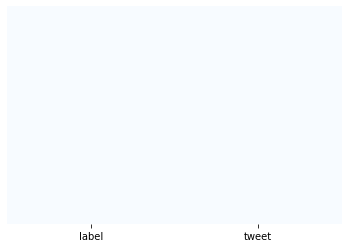

In [151]:
# Observe the heatmap for any missing/null values (there are none here)
sns.heatmap(tweets_df.isnull(), yticklabels=False, cbar=False, cmap='Blues')

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x0000017E7002C850>]],
      dtype=object)

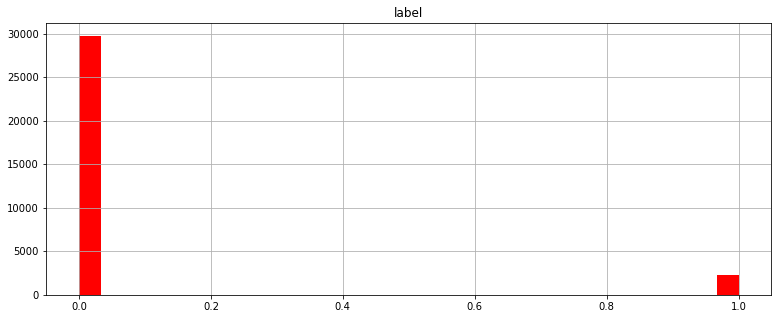

In [152]:
# Create a historgram of the different labels (0, 1)
tweets_df.hist(bins=30, figsize=(13,5), color='r')


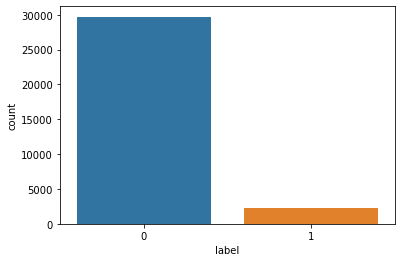

In [153]:
# Can also be done sns.countplot(tweets_df['column'], label = 'count')
# Plot the count of the various labels
ax = sns.countplot(x="label", data=tweets_df)

Here we can see that we have roughly 30,000 tweets that are deemed positive and 2,000 tweets that are negative.

In [154]:
# Create a new column that is a desciptor of a current column
tweets_df['length'] = tweets_df['tweet'].apply(len)

In [155]:
# Tells us information about the length column ex: min length is 11

tweets_df.describe()

,label,length
count,31962.000000,31962.000000
mean,0.070146,84.739628
std,0.255397,29.455749
min,0.000000,11.000000
25%,0.000000,63.000000
50%,0.000000,88.000000
75%,0.000000,108.000000
max,1.000000,274.000000


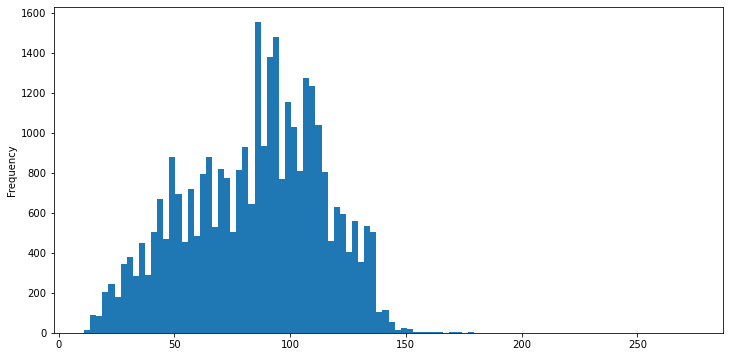

In [156]:
# Locate the shortest message
# We can now plot the length of tweets to get an idea for the distribution

tweets_df['length'].plot(bins=100, kind='hist', figsize=(12,6))

In [157]:
# Print out the message of the shortest tweet (the val 11 that we discovered earlier)

tweets_df[tweets_df['length'] == 11]['tweet'].iloc[0]

'i love you '

In [158]:
# Print the message length with the mean length
# Mean : 84

tweets_df[tweets_df['length'] == 84]['tweet'].iloc[0]

'my mom shares the same bihday as @user   bihday snake! see you this weekend ð\x9f\x99\x8cð\x9f\x8f¼'

In [159]:
# Return values of our data  set equal to a specefic length 

count_val = tweets_df[tweets_df['length'] == 34]
count_val.head()

,label,tweet,length
248,0,few more days till who is ? ð,34
518,0,days porn movie pussy pay pics,34
635,0,actually ordered a kylie lip kit,34
934,0,finally moving today ð­ðð½,34
977,0,way to sta the day #goodmorning,34


---
### Create Dataframes for negative and positive tweets
---

In [160]:
# Return positive tweets from data set

positive = tweets_df[tweets_df['label'] == 0]
positive

,label,tweet,length
0,0,@user when a father is dysfunctional and is s...,102
1,0,@user @user thanks for #lyft credit i can't us...,122
2,0,bihday your majesty,21
3,0,#model i love u take with u all the time in ...,86
4,0,factsguide: society now #motivation,39
...,...,...,...
31956,0,off fishing tomorrow @user carnt wait first ti...,61
31957,0,ate @user isz that youuu?ðððððð...,68
31958,0,to see nina turner on the airwaves trying to...,131
31959,0,listening to sad songs on a monday morning otw...,63


In [161]:
# Return negative values from data set

negative = tweets_df[tweets_df['label'] == 1]
negative

,label,tweet,length
13,1,@user #cnn calls #michigan middle school 'buil...,74
14,1,no comment! in #australia #opkillingbay #se...,101
17,1,retweet if you agree!,22
23,1,@user @user lumpy says i am a . prove it lumpy.,47
34,1,it's unbelievable that in the 21st century we'...,104
...,...,...,...
31934,1,lady banned from kentucky mall. @user #jcpenn...,59
31946,1,@user omfg i'm offended! i'm a mailbox and i'...,82
31947,1,@user @user you don't have the balls to hashta...,112
31948,1,"makes you ask yourself, who am i? then am i a...",87


----
# Plotting the Word Cloud
----


Text about why we are doing this


In [162]:
sentences = tweets_df['tweet'].tolist()
sentences

nly aryans are allowed to rape women! you're just a  troll! #eod @user @user",
 " @user speechless when it comes to all the shootings recently. i guess people have nothing to lose and don't have any respectâ\x80¦",
 ' @user as forecasted, the beautiful waves of raalhugandu has disappeared due to construction of the bridge.&amp; theres no hope of it comâ\x80¦',
 '@user any minute #trump will condemn the  #vile #bigoted comments of #his #surrogate #carlpaladino #endhateâ\x80¦ ',
 "#wishing all wonderful #dads a   #father's #day..let's #rock today at red rascalsâ\x80¦ ",
 '@user #allahsoil vps got multi-million dollar bonuses while average americans lost their homes.  â\x80¦â\x80¦ ',
 'i love #abrahamhicks and #lawofattraction !!   #healthy #healing   #joytrain !!    ',
 '#model   i love u take with u all the time in urð\x9f\x93±!!! ð\x9f\x98\x99ð\x9f\x98\x8eð\x9f\x91\x84ð\x9f\x91\x85ð\x9f\x92¦ð\x9f\x92¦ð\x9f\x92¦  ',
 'signed up for my first bikram yoga classâ\x98ºï¸\x8f  ',
 'think   th

In [163]:
# Check the length of all of the text

len(sentences)

31962

In [164]:
# Join all of the sentences of on label into one massive string

sentences_all_in_one_string = " ".join(sentences)

In [165]:
# Lazy load: Import WordCloud

from wordcloud import WordCloud


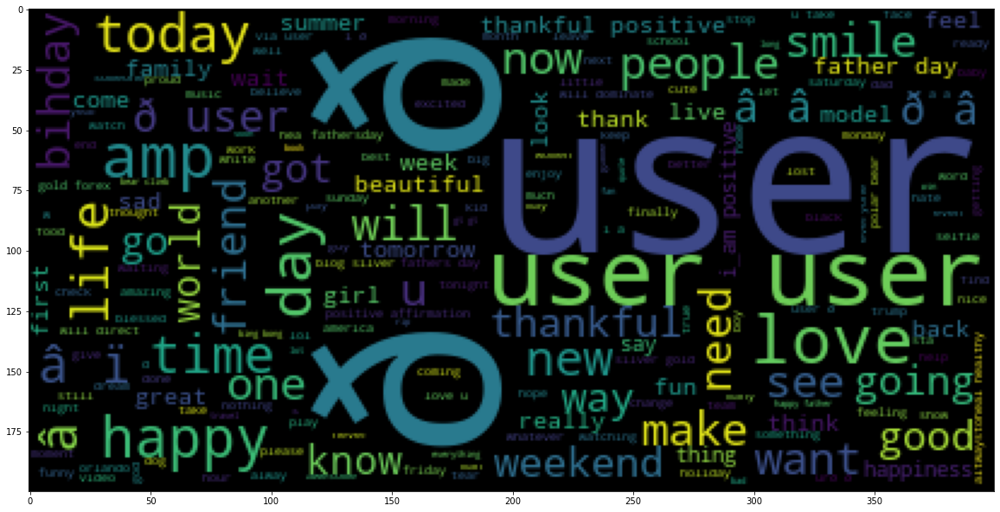

In [166]:
# Plot the image of all of the words plotted
# This allows us to visualize the words that come up most often

plt.figure(figsize=(20,20))

plt.imshow(WordCloud().generate(sentences_all_in_one_string))

## Plot the negative Dataframe

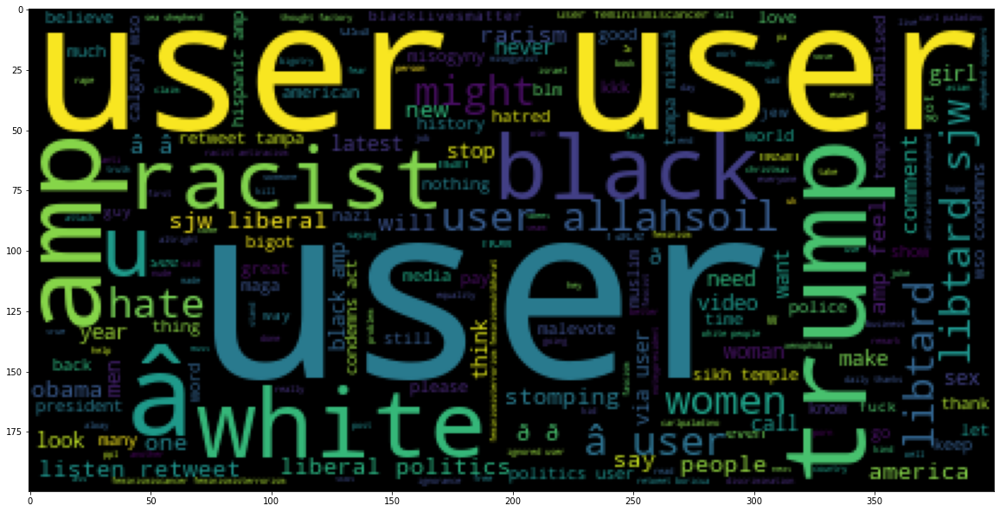

In [167]:
# Plot the wordcloud of the negative dataframe
# Notice there are more words that have to do with negativity (neg sentiment)

neg_list = negative['tweet'].tolist()
negative_sentences_as_one_string = " ".join(neg_list)
plt.figure(figsize=(20,20))
plt.imshow(WordCloud().generate(negative_sentences_as_one_string))

----
# Data Cleaning
----

It is important to clean data of punctuations and stop words before training models on the data set. ($, _, ?)  

In [168]:
# Lazy load: punctuation for cleaning

import string
string.punctuation

Test = 'Good morning beautiful people :)... I am having trying to get this to work!!'


In [169]:
# Printing this will show us if we were able to remove the unwanted charecters from our string

test_punc_removed = [ char for char in Test if char not in string.punctuation ]

In [170]:
test_punc_removed

['G',
 'o',
 'o',
 'd',
 ' ',
 'm',
 'o',
 'r',
 'n',
 'i',
 'n',
 'g',
 ' ',
 'b',
 'e',
 'a',
 'u',
 't',
 'i',
 'f',
 'u',
 'l',
 ' ',
 'p',
 'e',
 'o',
 'p',
 'l',
 'e',
 ' ',
 ' ',
 'I',
 ' ',
 'a',
 'm',
 ' ',
 'h',
 'a',
 'v',
 'i',
 'n',
 'g',
 ' ',
 't',
 'r',
 'y',
 'i',
 'n',
 'g',
 ' ',
 't',
 'o',
 ' ',
 'g',
 'e',
 't',
 ' ',
 't',
 'h',
 'i',
 's',
 ' ',
 't',
 'o',
 ' ',
 'w',
 'o',
 'r',
 'k']

In [171]:
# Join the charecters back together to fomr a string

test_punc_removed_string = "".join(test_punc_removed)
test_punc_removed_string

'Good morning beautiful people  I am having trying to get this to work'

In [172]:
# Here is method for looping through and removing the various punctuations in the text

Test_punc_removed = []
for char in Test:
    if char in string.punctuation:
        Test_punc_removed.append(char)

Test_punc_removed_join = "".join(Test_punc_removed)
Test_punc_removed_join

':)...!!'

----
# Remove Stop Words
----

We want to remove stop words because...they don't add much value!  This is why we want to reduce the words in our text to those that are more unique and provide signal for any ml model we train.

In [173]:
# Load NLTK

import nltk

nltk.download('stopwords')



[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\seanm\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [174]:
# Print list of English stopwords
# These are common and frequent words and are therefore not unique and not telling

from nltk.corpus import stopwords
stopwords.words('english')

['i',
 'me',
 'my',
 'myself',
 'we',
 'our',
 'ours',
 'ourselves',
 'you',
 "you're",
 "you've",
 "you'll",
 "you'd",
 'your',
 'yours',
 'yourself',
 'yourselves',
 'he',
 'him',
 'his',
 'himself',
 'she',
 "she's",
 'her',
 'hers',
 'herself',
 'it',
 "it's",
 'its',
 'itself',
 'they',
 'them',
 'their',
 'theirs',
 'themselves',
 'what',
 'which',
 'who',
 'whom',
 'this',
 'that',
 "that'll",
 'these',
 'those',
 'am',
 'is',
 'are',
 'was',
 'were',
 'be',
 'been',
 'being',
 'have',
 'has',
 'had',
 'having',
 'do',
 'does',
 'did',
 'doing',
 'a',
 'an',
 'the',
 'and',
 'but',
 'if',
 'or',
 'because',
 'as',
 'until',
 'while',
 'of',
 'at',
 'by',
 'for',
 'with',
 'about',
 'against',
 'between',
 'into',
 'through',
 'during',
 'before',
 'after',
 'above',
 'below',
 'to',
 'from',
 'up',
 'down',
 'in',
 'out',
 'on',
 'off',
 'over',
 'under',
 'again',
 'further',
 'then',
 'once',
 'here',
 'there',
 'when',
 'where',
 'why',
 'how',
 'all',
 'any',
 'both',
 'each

In [175]:
# Take the cleaned sentece that we created earlier
# These words are remaining after we remove punctuatction and stopwords

Test_punc_removed_string_clean = [word for word in test_punc_removed_string.split() if word.lower() not in stopwords.words('english')]
Test_punc_removed_string_clean

['Good', 'morning', 'beautiful', 'people', 'trying', 'get', 'work']

In [176]:
###=========== THIS IS AN EXAMPLE OF OF MINI SNIPPET ========###
# Pipeline to first remove punctuation and then remove stopwords

test_new_string = "This has been a tough week!! I hope... I can relax sometime soon :)"
# REturn all of the charecters with the special charecters removed
val = [ char for char in test_new_string if char not in string.punctuation ]
# Join the letters into words
val = "".join(val)
# Return each word that is not a stopword
val = [ word for word in val.split() if word.lower() not in stopwords.words('english') ]
val

['tough', 'week', 'hope', 'relax', 'sometime', 'soon']

----
# Count Vectorization (Tokenization)
----

Here we will transform our text data into a series of numbers to fit into our model.


The process works by creating a table with the number of rows being the lines (sentences) and the columns representing the frequency of the words in each line.  This creates a frequency matrix.

Ex:
This is the first paper.
This paper is the second paper.
And  this is the third one.
Is this the final paper?

Returns:

### Word Frequency by line

| and | paper | first | is | one | second | the | third | this |
|-----|-------|-------|----|-----|--------|-----|-------|------|
|  0  |   1   |   1   |  1 |  0  |    0   |  1  |   0   |   1  |
|  0  |   2   |   0   |  1 |  0  |    1   |  1  |   0   |   1  |
|  1  |   0   |   0   |  1 |  1  |    0   |  1  |   1   |   1  |
|  0  |   1   |   1   |  1 |  0  |    0   |  1  |   0   |   1  |

In [177]:
from sklearn.feature_extraction.text import CountVectorizer

sample_data = ['This is the first paper.', 'This paper is the second paper.', 'And this is the third one.', 'Is this the final paper?']

# Instantiate object out of class
vectorizer = CountVectorizer()
X = vectorizer.fit_transform(sample_data)

In [178]:
# This will print out all of the unique words (features in the string)

print(vectorizer.get_feature_names())


['and', 'final', 'first', 'is', 'one', 'paper', 'second', 'the', 'third', 'this']


In [179]:
# Provide the array of tokenized words in the string

print(X.toarray())

[[0 0 1 1 0 1 0 1 0 1]
 [0 0 0 1 0 2 1 1 0 1]
 [1 0 0 1 1 0 0 1 1 1]
 [0 1 0 1 0 1 0 1 0 1]]


----
# Creating the Data Cleaning Pipeline
----

In [180]:
# Function for taking in the tweet and cleaning it

def message_clean(message):
    """
    This function will clean a tweet/message that is passed to it

    :param message: This is the tweet or text message to be cleaned
    :return: Cleaned message with stop words and special punctuation removed
    """

    test_punc_removed = [char for char in message if char not in string.punctuation]
    test_punc_removed_join = "".join(test_punc_removed)
    test_punc_removed_clean = [word for word in test_punc_removed_join.split() if word.lower() not in stopwords.words('english')]

    return test_punc_removed_clean

In [181]:
# Testing the clean message function
tweets_df_clean = tweets_df['tweet'].apply(message_clean)

In [183]:
# Cleaned Version
print(tweets_df_clean[5])

['22', 'huge', 'fan', 'fare', 'big', 'talking', 'leave', 'chaos', 'pay', 'disputes', 'get', 'allshowandnogo']


In [184]:
# This is the original message:  Here we can see the difference
print(tweets_df['tweet'][5])

[2/2] huge fan fare and big talking before they leave. chaos and pay disputes when they get there. #allshowandnogo  


In [238]:
# Vectorize our function to reduce compute time
from sklearn.feature_extraction.text import CountVectorizer

# Define cleaning pipeline
vectorizer = CountVectorizer(analyzer=message_clean)

# tweets_countvectorizer = CountVectorizer(analyzer=message_clean, dtype='uint8').fit_transform(tweets_df['tweet'])
tweets_countvectorizer = vectorizer.fit_transform(tweets_df['tweet'])


In [239]:
tweets_countvectorizer.shape

(31962, 47386)

In [240]:
#x = tweets_countvectorizer
y = tweets_df['label']
x  = pd.DataFrame(tweets_countvectorizer.toarray())

----
# Naive Bayes
----

## Theory in practice


Method for classification using prior porbabilities and liklihood to make predictions.

Prior porbabilities = count of type / total      $P(Retire)$

Liklihood = count of type in circle around x / total nunmber of type    $P(X|Retire)$

marginal Liklihood = number of points around circle / total number of points $P(X)$

Multiply the probabilities:  Prior * Liklihood



Probability of a customer retiring given their features

$ P(Retire|X) = (P(X|Retire) * P(Retire)) / P(X)$

## Train the Model

In [241]:
x.shape

(31962, 47386)

In [242]:
y.shape

(31962,)

In [243]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x,  y, test_size = 0.2)

In [246]:
from sklearn.naive_bayes import MultinomialNB

nb_classifier = MultinomialNB()
nb_classifier.fit(x_train, y_train)


MultinomialNB()

----
# Assess Trained Model
----

We can use confusion matrix to determine the accuracy of our model generalizations. This will tell ous the amount of Type 1 and Type 2 errors.

In [252]:
from sklearn.metrics import classification_report, confusion_matrix

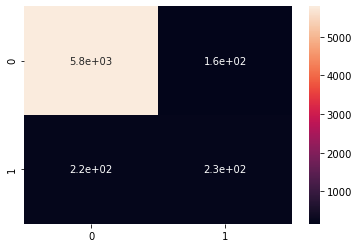

In [253]:
# Predicting test set results
# Correctly classified the top left and bottom right points
# Analysis: model has way to go, try to upsample negative class, downsample positve, feature enginnering)

y_predict_test = nb_classifier.predict(x_test)
cm = confusion_matrix(y_test, y_predict_test)
sns.heatmap(cm, annot=True)

In [254]:
# Note we are working with an unblanced data set
print(classification_report(y_test, y_predict_test))

              precision    recall  f1-score   support

           0       0.96      0.97      0.97      5950
           1       0.58      0.51      0.55       443

    accuracy                           0.94      6393
   macro avg       0.77      0.74      0.76      6393
weighted avg       0.94      0.94      0.94      6393



----
# Conclusion
----

Naive Bayes did an decent job classiying the tweets as either negative or postive.  While it was able to operate on a basic level, we can improve perfromance by gathering more balanced data and training various types of models.  Up next we can try and measure performance against logistic regreessions, neural networks, and ANN.
